<a href="https://colab.research.google.com/github/SaiTarunUppari/RIG/blob/main/Image_Processing_basics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving bottle.jpg to bottle.jpg
Saving duck.jpg to duck.jpg
Saving duck_big.jpg to duck_big.jpg
Saving emma big.jpg to emma big.jpg
Saving emma.jpg to emma.jpg
Saving g_noise.jpg to g_noise.jpg
Saving g_noise_big.jpg to g_noise_big.jpg
Saving mario.png to mario.png
Saving mario_big.png to mario_big.png
Saving sap_noise.jpg to sap_noise.jpg
Saving sap_noise_big.jpg to sap_noise_big.jpg
Saving snake big.png to snake big.png
Saving snake.png to snake.png


**Importing necessary libaries**

In [81]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

**Reading the image in Color**

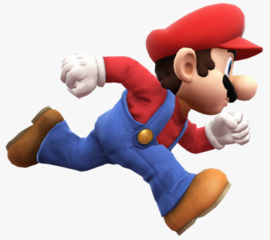

In [82]:
image = cv2.imread("mario.png",cv2.IMREAD_COLOR)
cv2_imshow(image)

**Finding the shape of the image**

In [83]:
image.shape

(240, 270, 3)

**Finding the color of the (200,200) pixel**

In [84]:
print("Color of (200,200) pixel in BGR format =",image[200,200,:])

Color of (200,200) pixel in BGR format = [ 58 118 200]


**Reading the image in grayscale**

shape = (240, 270)
Luminosity of (200,200) pixel in BGR format = 144


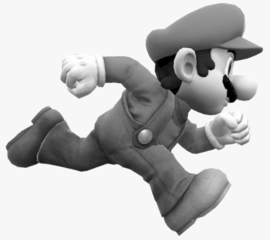

In [85]:
gray = cv2.imread("mario.png",cv2.IMREAD_GRAYSCALE)
print("shape =",gray.shape)
print("Luminosity of (200,200) pixel in BGR format =", gray[200,200])
cv2_imshow(gray)

**Displaying the red channel**

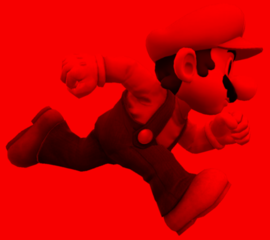

In [86]:
red = image.copy()
red[:,:,0:2] = 0
cv2_imshow(red)

**Converting to RGB**

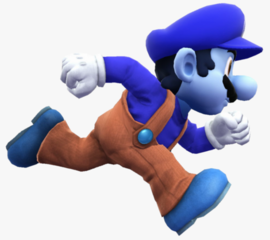

In [87]:
rgb = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
cv2_imshow(rgb)

**Converting to HSV**

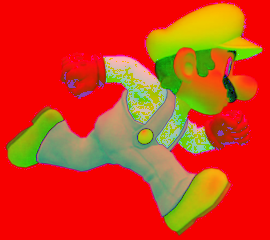

In [88]:
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
cv2_imshow(hsv)

**Converting to YCrCb**

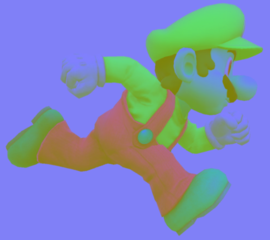

In [89]:
ycrcb = cv2.cvtColor(image,cv2.COLOR_BGR2YCrCb)
cv2_imshow(ycrcb)

**Converting to Lab**

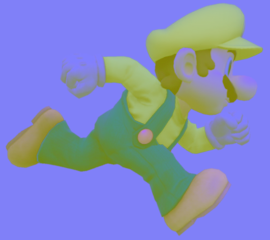

In [90]:
lab = cv2.cvtColor(image,cv2.COLOR_BGR2Lab)
cv2_imshow(lab)

**Dispalying all color spaces**

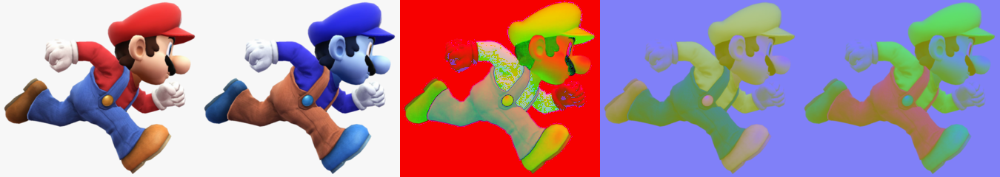

In [91]:
stack = np.concatenate((image,rgb,hsv,lab,ycrcb),axis=1)
cv2_imshow(stack)

**Thresholding**

---



**Reading the image and convertin g it into grayscale**

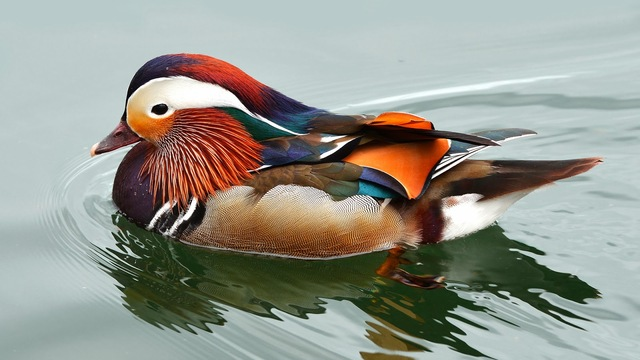

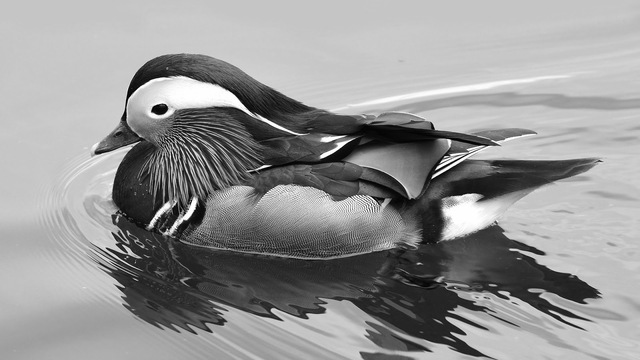

In [92]:
duck = cv2.imread("duck.jpg")
cv2_imshow(duck)
gray = cv2.cvtColor(duck,cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

**Binarizing the grayscale image using global threshold value**

127.0


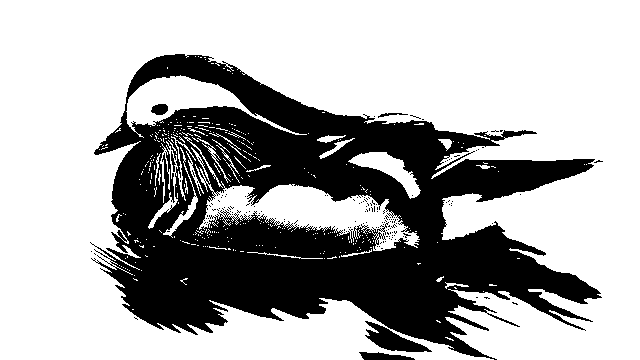

In [93]:
retval, thresh = cv2.threshold(gray,127,255,cv2.THRESH_BINARY)
print(retval)
cv2_imshow(thresh)

**Binarizing the image using Otsu's binarization method**

125.0


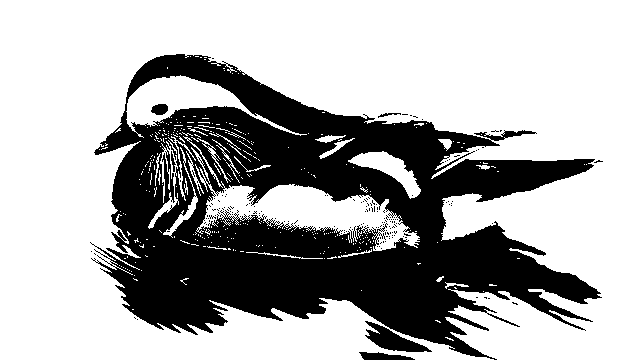

In [94]:
retval, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
print(retval)
cv2_imshow(thresh)

**Filtering**

---



In [104]:
image = cv2.imread("emma.jpg")
image_big = cv2.imread("emma_big.jpg")

**Creating a 5x5 averaging kernel**

In [96]:
kernel = np.ones((5,5),np.uint8)/(5*5)
print(kernel)

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


**Blurring using an averaging kernel**

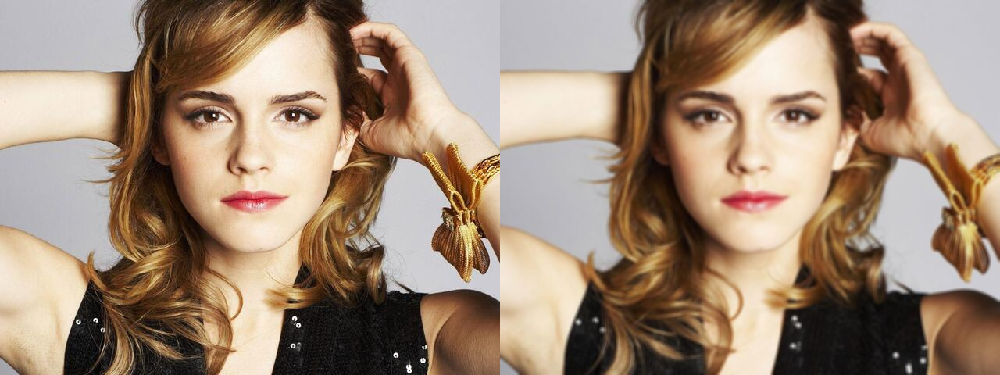

In [97]:
avg_blur = cv2.filter2D(image,-1,kernel)
stack = np.hstack((image,avg_blur))
cv2_imshow(stack)
# cv2_imshow(avg_blur)

**Gaussian Blur**

---



**Reading an image with gaussian noise**

In [98]:
gauss_noise = cv2.imread("g_noise_big.jpg")

**Performing gaussian blur on the above image**

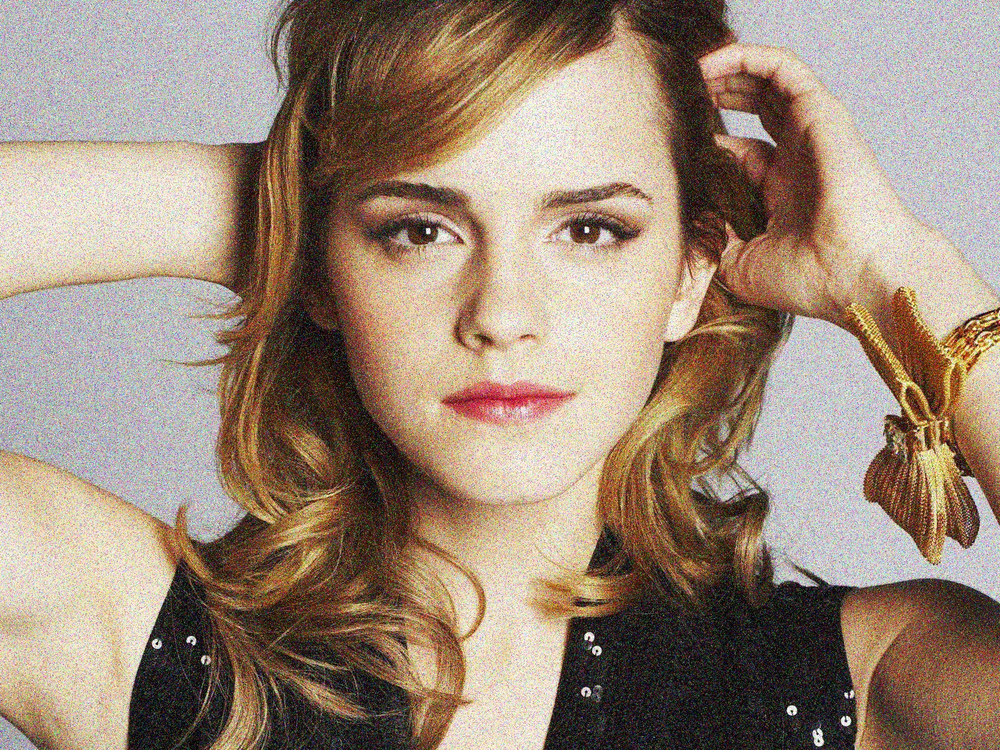

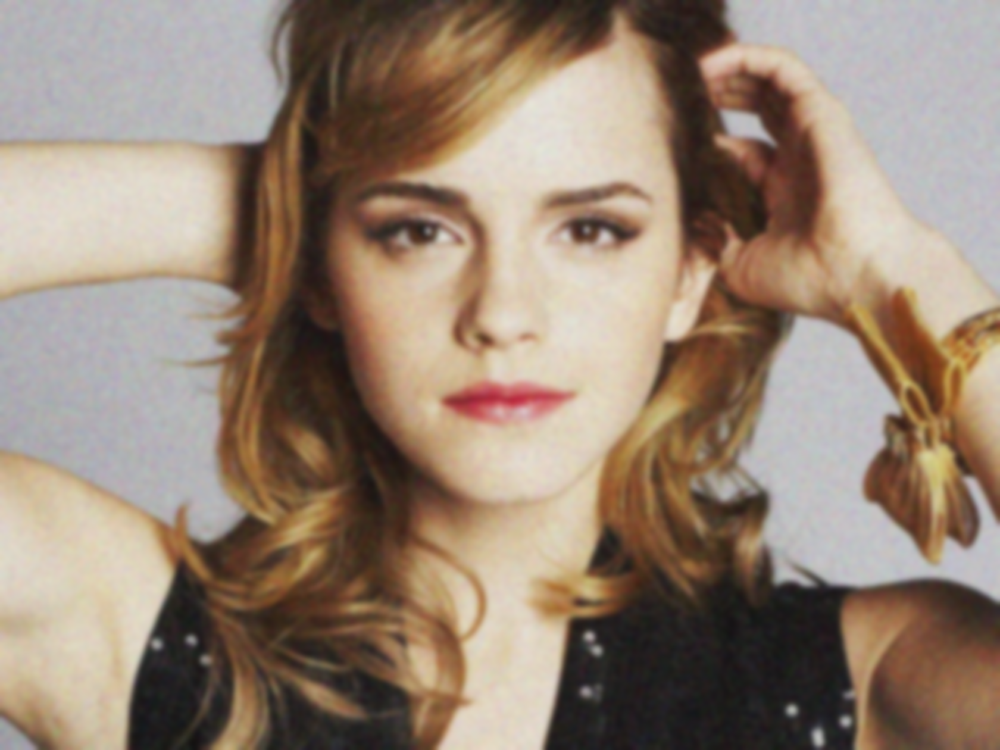

In [99]:
gauss_blur = cv2.GaussianBlur(gauss_noise,(29,29),0)
# stack = np.hstack((gauss_noise,gauss_blur))
cv2_imshow(gauss_noise)
cv2_imshow(gauss_blur)

**Median BLur**

---



**Reading an image with salt and pepper noise**

In [100]:
noise = cv2.imread("sap_noise_big.jpg")

**Removing the salt and pepper noise using median blur with a 9x9 kernel**

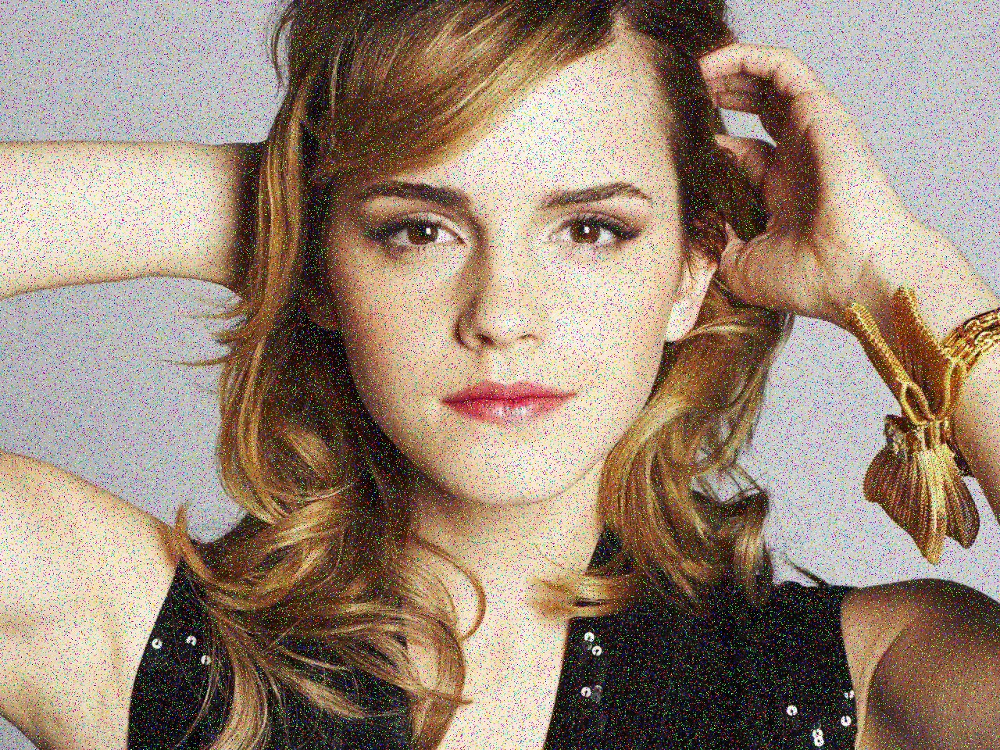

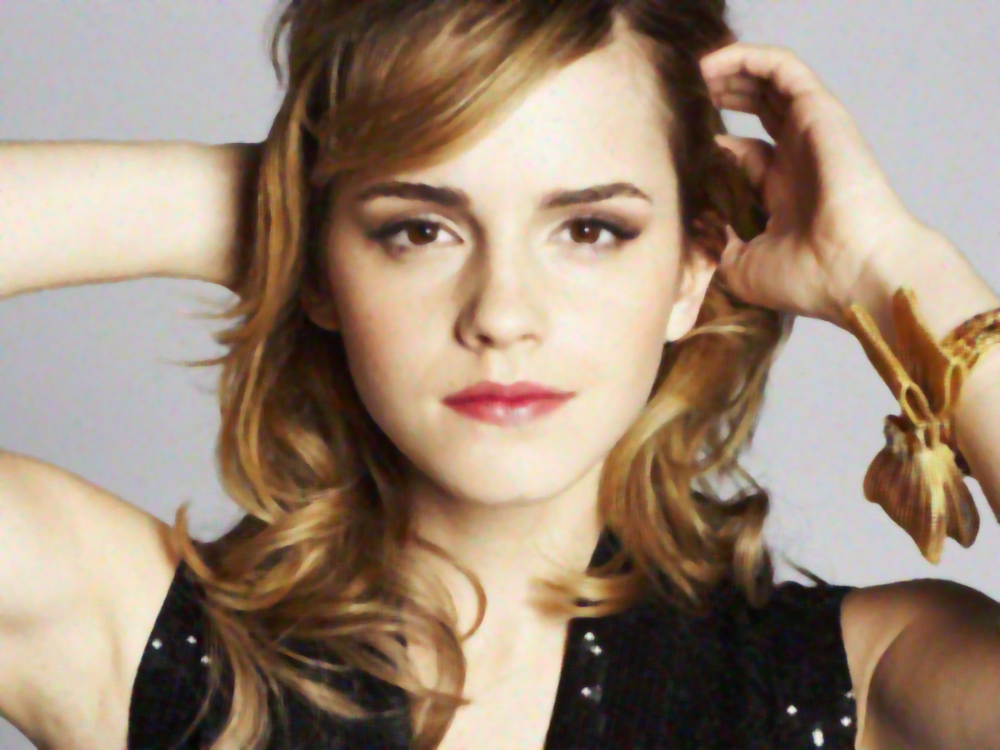

In [101]:
median = cv2.medianBlur(noise,9)
# stack = np.hstack((noise,median))
cv2_imshow(noise)
cv2_imshow(median)

In [102]:
def vstack(tup):
  return np.vstack(tup)
def hstack(tup):
  return np.hstack(tup)

**Geometrical Transformations**

---



**Rotation**

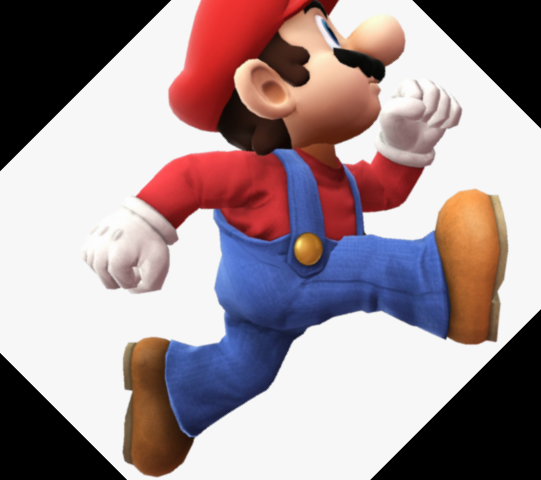

In [109]:
image = cv2.imread('mario_big.png')
rows,cols = image.shape[:2]

M = cv2.getRotationMatrix2D((cols/2,rows/2),45,1)
rotated = cv2.warpAffine(image,M,(cols,rows))
cv2_imshow(rotated)

**Translation**

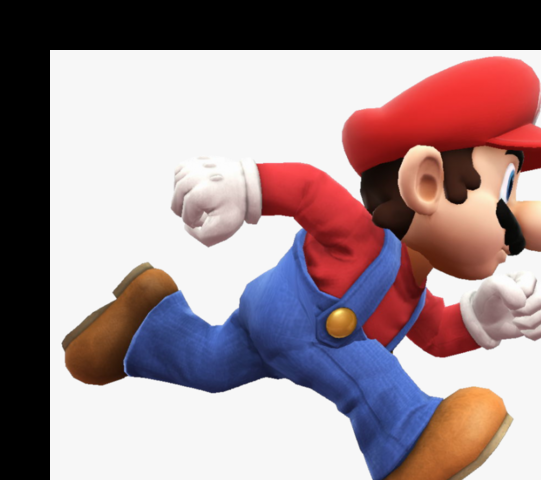

In [112]:
M = np.float32([[1,0,50],[0,1,50]])
shifted = cv2.warpAffine(image,M,(cols,rows))
cv2_imshow(shifted)